In [1]:
import os
import glob
import shutil
import librosa
import numpy as np
import tensorflow as tf
import cv2
from sklearn.model_selection import StratifiedShuffleSplit
from tensorflow.keras import layers, models
import matplotlib.pyplot as plt


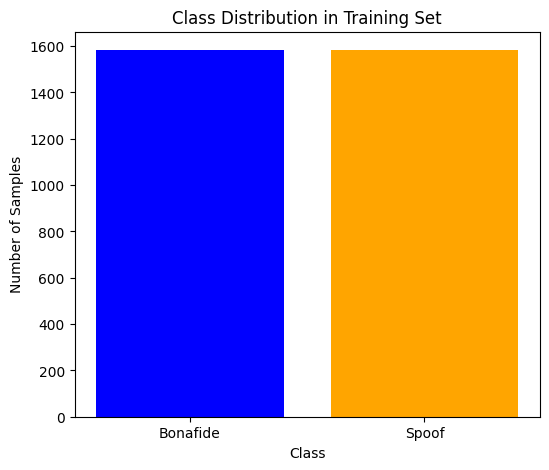

d:\download\fyp\.venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


ValueError: Invalid dtype: str1984

In [2]:
import os
import glob
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, models
from sklearn.model_selection import StratifiedShuffleSplit
import matplotlib.pyplot as plt
from collections import Counter

# Path to metadata file
metadata_file_path = r'D:\download\Compressed\DF-keys-full\keys\DF\CM\trial_metadata.txt'

# Dictionary to hold file identifiers and labels
labels = {}

# Read the metadata file and store labels
with open(metadata_file_path, 'r') as f:
    for line in f:
        parts = line.strip().split()
        file_identifier = parts[1]  # Example: DF_E_2000011
        label = parts[5]            # Example: "spoof" or "bonafide"
        labels[file_identifier] = label

# Directory containing the 10% subset of audio files
subset_dir = r'D:\audio_files\undersampled_audio_10_percent'

# Find all .flac files in the 10% subset directory
subset_audio_files = glob.glob(os.path.join(subset_dir, '*.flac'))

# Filter files to get their labels in binary format
subset_labels = []
valid_audio_files = []

for file_path in subset_audio_files:
    file_name = os.path.basename(file_path)
    file_identifier = file_name.split('.')[0]  # Extract identifier before extension
    
    if file_identifier in labels:
        valid_audio_files.append(file_path)
        subset_labels.append(1 if labels[file_identifier] == 'spoof' else 0)

# Convert lists to numpy arrays for compatibility with stratified splitting
valid_audio_files = np.array(valid_audio_files)
subset_labels = np.array(subset_labels)

# Stratified 70:30 train-test split
strat_split = StratifiedShuffleSplit(n_splits=1, test_size=0.3, random_state=42)
for train_idx, test_idx in strat_split.split(valid_audio_files, subset_labels):
    X_train, X_test = valid_audio_files[train_idx], valid_audio_files[test_idx]
    y_train, y_test = subset_labels[train_idx], subset_labels[test_idx]

# Check class distribution in the training set
train_counts = Counter(y_train)
labels = ['Bonafide', 'Spoof']
train_values = [train_counts[0], train_counts[1]]

# Plotting class distribution in the training set
plt.figure(figsize=(6, 5))
plt.bar(labels, train_values, color=['blue', 'orange'])
plt.title('Class Distribution in Training Set')
plt.xlabel('Class')
plt.ylabel('Number of Samples')
plt.show()

# Model definition
def build_cnn(input_shape):
    model = models.Sequential()
    model.add(layers.Conv2D(32, kernel_size=(3, 3), activation='relu', input_shape=input_shape))
    model.add(layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(layers.Conv2D(64, kernel_size=(3, 3), activation='relu'))
    model.add(layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(layers.Conv2D(128, kernel_size=(3, 3), activation='relu'))
    model.add(layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(layers.Flatten())
    model.add(layers.Dense(128, activation='relu'))
    model.add(layers.Dropout(0.5))
    model.add(layers.Dense(1, activation='sigmoid'))
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model

# Define input shape (assumes preprocessed audio data, e.g., MFCCs, to 128x128)
input_shape = (128, 128, 1)
model = build_cnn(input_shape)

# Early stopping
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=15, restore_best_weights=True)

# Placeholder for loading audio data into arrays (replace with actual loading process)
# X_train, X_test should be numpy arrays representing your audio data after loading and preprocessing
# For example:
# X_train = load_audio_files(X_train_files)
# X_test = load_audio_files(X_test_files)

# Train the model (using the training data and no validation set)
history = model.fit(X_train, y_train, epochs=20, batch_size=32, callbacks=[early_stopping])

# Evaluate on the test set
test_loss, test_acc = model.evaluate(X_test, y_test, verbose=2)
print(f'Test accuracy: {test_acc}')

# Plot accuracy and loss over training epochs
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.title('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.title('Loss')
plt.legend()

plt.show()


In [ ]:
# Find all .flac files in the undersampled directory
audio_files = glob.glob(os.path.join(undersampled_audio_dir, '*.flac'))

# Filter only the files with labels in the metadata
valid_audio_files = []
valid_labels = []

for audio_file in audio_files:
    file_name = os.path.basename(audio_file)
    file_identifier = file_name.split('.')[0]  # Extract identifier before extension
    
    if file_identifier in labels:
        valid_audio_files.append(audio_file)
        valid_labels.append(labels[file_identifier])  # Store "spoof" or "bonafide"


In [ ]:
def audio_to_mfcc(audio_file, sr=16000, n_mfcc=13):
    audio, sample_rate = librosa.load(audio_file, sr=sr)
    mfcc = librosa.feature.mfcc(y=audio, sr=sample_rate, n_mfcc=n_mfcc)
    return mfcc

def resize_spectrogram(spectrogram, target_size=(128, 128)):
    return cv2.resize(spectrogram, target_size)

def preprocess_audio_files(audio_files, labels, target_size=(128, 128)):
    mfcc_data = []
    label_data = []
    
    for audio_file, label in zip(audio_files, labels):
        mfcc = audio_to_mfcc(audio_file)
        resized_mfcc = resize_spectrogram(mfcc, target_size)
        normalized_mfcc = resized_mfcc / np.max(resized_mfcc) if np.max(resized_mfcc) > 0 else resized_mfcc
        mfcc_data.append(normalized_mfcc)
        label_data.append(label)
    
    return np.array(mfcc_data), np.array(label_data)

# Preprocess subset audio files
X, y = preprocess_audio_files(subset_audio_files, subset_labels, target_size=(128, 128))

# Add channel dimension
X = np.expand_dims(X, axis=-1)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━

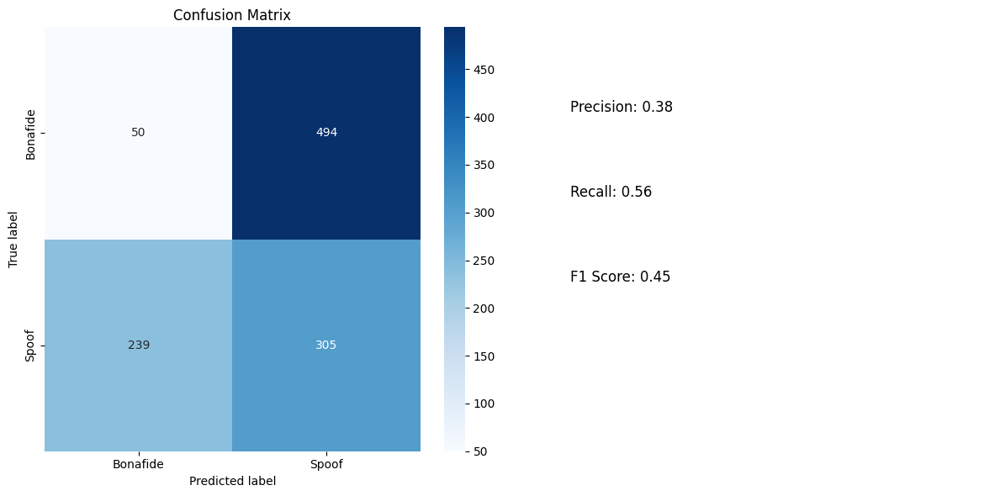

In [15]:
import os
import numpy as np
import librosa
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score
from tensorflow.keras.models import load_model

# Load the trained model
model_path = "0.98.keras"  # Replace with the path to your trained model
model = load_model(model_path)

# Function to preprocess a single audio file
def preprocess_single_audio(audio_file, target_size=(128, 128)):
    y, sr = librosa.load(audio_file, sr=None)
    mfcc = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=128)
    resized_mfcc = np.resize(mfcc, target_size)

    max_value = np.max(resized_mfcc)
    normalized_mfcc = resized_mfcc / max_value if max_value > 0 else resized_mfcc

    single_input = np.expand_dims(normalized_mfcc, axis=-1)
    single_input_rgb = np.repeat(single_input, 3, axis=-1)
    single_input_rgb = np.expand_dims(single_input_rgb, axis=0)

    return single_input_rgb

# Function to predict labels for all files in a directory
def predict_from_directory(directory_path, true_label):
    predictions = []
    ground_truth = []

    for file_name in os.listdir(directory_path):
        if file_name.endswith(".wav"):
            file_path = os.path.join(directory_path, file_name)
            processed_audio = preprocess_single_audio(file_path)

            prediction = model.predict(processed_audio)
            predicted_label = 1 if prediction >= 0.5 else 0  # Assuming binary classification (0: Bonafide, 1: Spoof)

            predictions.append(predicted_label)
            ground_truth.append(true_label)

    return predictions, ground_truth

# Define the directories
real_dir = r'D:\for-2seconds\testing\real'  # Label 0: Bonafide
fake_dir = r'D:\for-2seconds\testing\fake'  # Label 1: SpoofD:\for-2seconds\testing\real

# Get predictions and ground truths for both directories
real_predictions, real_ground_truth = predict_from_directory(real_dir, true_label=0)
fake_predictions, fake_ground_truth = predict_from_directory(fake_dir, true_label=1)

# Combine predictions and ground truths
y_pred = real_predictions + fake_predictions
y_true = real_ground_truth + fake_ground_truth

# Calculate confusion matrix and metrics
conf_matrix = confusion_matrix(y_true, y_pred, labels=[0, 1])
precision = precision_score(y_true, y_pred, pos_label=1)
recall = recall_score(y_true, y_pred, pos_label=1)
f1 = f1_score(y_true, y_pred, pos_label=1)

# Plot the confusion matrix and metrics
plt.figure(figsize=(12, 6))

# Subplot 1: Confusion Matrix
plt.subplot(1, 2, 1)
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=["Bonafide", "Spoof"],
            yticklabels=["Bonafide", "Spoof"])
plt.title("Confusion Matrix")
plt.xlabel("Predicted label")
plt.ylabel("True label")

# Subplot 2: Metrics
plt.subplot(1, 2, 2)
plt.text(0.1, 0.8, f"Precision: {precision:.2f}", fontsize=12)
plt.text(0.1, 0.6, f"Recall: {recall:.2f}", fontsize=12)
plt.text(0.1, 0.4, f"F1 Score: {f1:.2f}", fontsize=12)
plt.axis("off")

plt.tight_layout()
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━

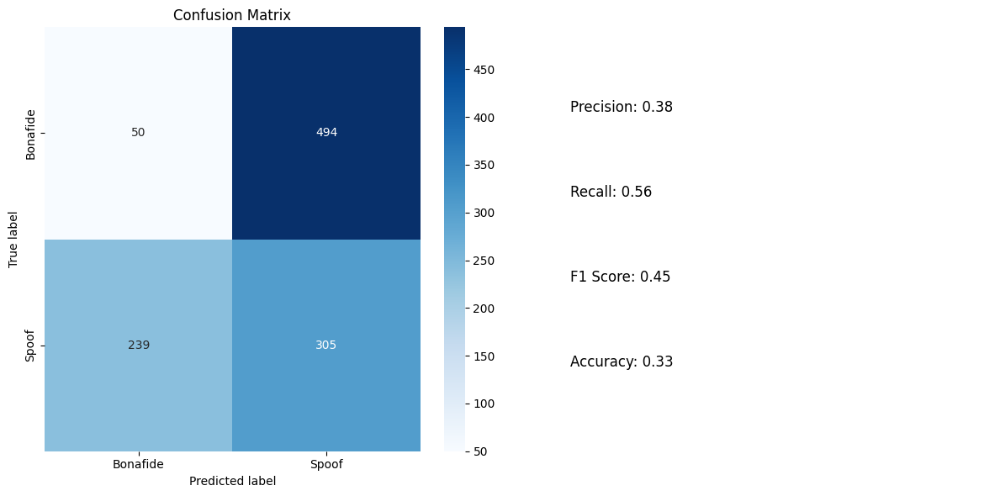

In [21]:
import os
import numpy as np
import librosa
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score, accuracy_score
from tensorflow.keras.models import load_model

# Load the trained model
model_path = "0.98.keras"  # Replace with the path to your trained model
model = load_model(model_path)

# Function to preprocess a single audio file
def preprocess_single_audio(audio_file, target_size=(128, 128)):
    y, sr = librosa.load(audio_file, sr=None)
    mfcc = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=128)
    resized_mfcc = np.resize(mfcc, target_size)

    # Normalize MFCCs
    max_value = np.max(resized_mfcc)
    normalized_mfcc = resized_mfcc / max_value if max_value > 0 else resized_mfcc

    # Add channel dimension and prepare input for model
    single_input = np.expand_dims(normalized_mfcc, axis=-1)
    single_input_rgb = np.repeat(single_input, 3, axis=-1)
    single_input_rgb = np.expand_dims(single_input_rgb, axis=0)

    return single_input_rgb

# Function to predict labels for all files in a directory
def predict_from_directory(directory_path, true_label):
    predictions = []
    ground_truth = []

    for file_name in os.listdir(directory_path):
        if file_name.endswith(".wav"):
            file_path = os.path.join(directory_path, file_name)
            processed_audio = preprocess_single_audio(file_path)

            # Model prediction
            prediction = model.predict(processed_audio)
            predicted_label = 1 if prediction >= 0.5 else 0  # Binary classification: 0 (Bonafide), 1 (Spoof)

            predictions.append(predicted_label)
            ground_truth.append(true_label)

    return predictions, ground_truth

# Define the directories
fake_dir = r'D:\for-2seconds\testing\fake'  # Label 1: Spoof
real_dir = r'D:\for-2seconds\testing\real' # Label 0: Bonafide

# Get predictions and ground truths for both directories
real_predictions, real_ground_truth = predict_from_directory(real_dir, true_label=0)
fake_predictions, fake_ground_truth = predict_from_directory(fake_dir, true_label=1)

# Combine predictions and ground truths using np.concatenate to ensure consistency
y_pred = np.concatenate([real_predictions, fake_predictions])
y_true = np.concatenate([real_ground_truth, fake_ground_truth])

# Calculate confusion matrix and metrics
conf_matrix = confusion_matrix(y_true, y_pred, labels=[0, 1])
precision = precision_score(y_true, y_pred, pos_label=1)
recall = recall_score(y_true, y_pred, pos_label=1)
f1 = f1_score(y_true, y_pred, pos_label=1)
accuracy = accuracy_score(y_true, y_pred)

# Plot the confusion matrix and metrics
plt.figure(figsize=(12, 6))

# Subplot 1: Confusion Matrix
plt.subplot(1, 2, 1)
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=["Bonafide", "Spoof"],
            yticklabels=["Bonafide", "Spoof"])
plt.title("Confusion Matrix")
plt.xlabel("Predicted label")
plt.ylabel("True label")

# Subplot 2: Metrics
plt.subplot(1, 2, 2)
plt.text(0.1, 0.8, f"Precision: {precision:.2f}", fontsize=12)
plt.text(0.1, 0.6, f"Recall: {recall:.2f}", fontsize=12)
plt.text(0.1, 0.4, f"F1 Score: {f1:.2f}", fontsize=12)
plt.text(0.1, 0.2, f"Accuracy: {accuracy:.2f}", fontsize=12)
plt.axis("off")

plt.tight_layout()
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━

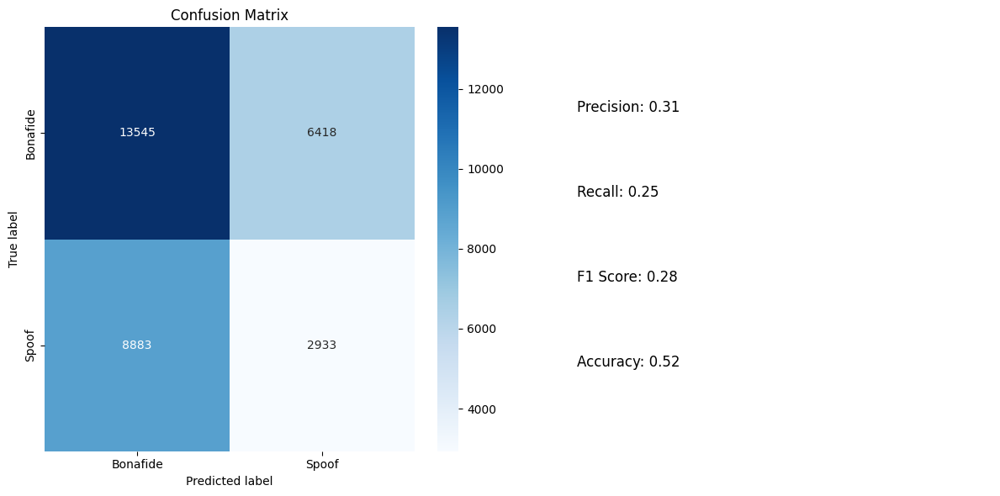

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━

KeyboardInterrupt: 

In [1]:
import os
import numpy as np
import librosa
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score, accuracy_score
from tensorflow.keras.models import load_model

# Load the trained model
model_path = "0.99.keras"  # Replace with the path to your trained model
model = load_model(model_path)
import os
import numpy as np
import librosa
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score, accuracy_score
from tensorflow.keras.models import load_model

# Load the trained model
model_path = "0.98.keras"  # Replace with the path to your trained model
model = load_model(model_path)

# Function to preprocess a single audio file
def preprocess_single_audio(audio_file, target_size=(128, 128)):
    y, sr = librosa.load(audio_file, sr=None)
    mfcc = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=128)
    resized_mfcc = np.resize(mfcc, target_size)

    # Normalize MFCCs
    max_value = np.max(resized_mfcc)
    normalized_mfcc = resized_mfcc / max_value if max_value > 0 else resized_mfcc

    # Add channel dimension and prepare input for model
    single_input = np.expand_dims(normalized_mfcc, axis=-1)
    single_input_rgb = np.repeat(single_input, 3, axis=-1)
    single_input_rgb = np.expand_dims(single_input_rgb, axis=0)

    return single_input_rgb

# Function to predict labels for all files in a directory
def predict_from_directory(directory_path, true_label):
    predictions = []
    ground_truth = []

    for file_name in os.listdir(directory_path):
        if file_name.endswith(".wav"):
            file_path = os.path.join(directory_path, file_name)
            processed_audio = preprocess_single_audio(file_path)

            # Model prediction
            prediction = model.predict(processed_audio)
            predicted_label = 1 if prediction >= 0.5 else 0  # Binary classification: 0 (Bonafide), 1 (Spoof)

            predictions.append(predicted_label)
            ground_truth.append(true_label)

    return predictions, ground_truth

# Define the directories
fake_dir = r'D:\fake'  # Label 1: Spoof
real_dir = r'D:\real' # Label 0: Bonafide

# Get predictions and ground truths for both directories
real_predictions, real_ground_truth = predict_from_directory(real_dir, true_label=0)
fake_predictions, fake_ground_truth = predict_from_directory(fake_dir, true_label=1)

# Combine predictions and ground truths using np.concatenate to ensure consistency
y_pred = np.concatenate([real_predictions, fake_predictions])
y_true = np.concatenate([real_ground_truth, fake_ground_truth])

# Calculate confusion matrix and metrics
conf_matrix = confusion_matrix(y_true, y_pred, labels=[0, 1])
precision = precision_score(y_true, y_pred, pos_label=1)
recall = recall_score(y_true, y_pred, pos_label=1)
f1 = f1_score(y_true, y_pred, pos_label=1)
accuracy = accuracy_score(y_true, y_pred)

# Plot the confusion matrix and metrics
plt.figure(figsize=(12, 6))

# Subplot 1: Confusion Matrix
plt.subplot(1, 2, 1)
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=["Bonafide", "Spoof"],
            yticklabels=["Bonafide", "Spoof"])
plt.title("Confusion Matrix")
plt.xlabel("Predicted label")
plt.ylabel("True label")

# Subplot 2: Metrics
plt.subplot(1, 2, 2)
plt.text(0.1, 0.8, f"Precision: {precision:.2f}", fontsize=12)
plt.text(0.1, 0.6, f"Recall: {recall:.2f}", fontsize=12)
plt.text(0.1, 0.4, f"F1 Score: {f1:.2f}", fontsize=12)
plt.text(0.1, 0.2, f"Accuracy: {accuracy:.2f}", fontsize=12)
plt.axis("off")

plt.tight_layout()
plt.show()

# Function to preprocess a single audio file
def preprocess_single_audio(audio_file, target_size=(128, 128)):
    y, sr = librosa.load(audio_file, sr=None)
    mfcc = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=128)
    resized_mfcc = np.resize(mfcc, target_size)

    max_value = np.max(resized_mfcc)
    normalized_mfcc = resized_mfcc / max_value if max_value > 0 else resized_mfcc

    single_input = np.expand_dims(normalized_mfcc, axis=-1)
    single_input_rgb = np.repeat(single_input, 3, axis=-1)
    single_input_rgb = np.expand_dims(single_input_rgb, axis=0)

    return single_input_rgb

# Function to predict labels for all files in a directory
def predict_from_directory(directory_path, true_label):
    predictions = []
    ground_truth = []

    for file_name in os.listdir(directory_path):
        if file_name.endswith(".wav"):
            file_path = os.path.join(directory_path, file_name)
            processed_audio = preprocess_single_audio(file_path)

            prediction = model.predict(processed_audio)
            predicted_label = 1 if prediction >= 0.5 else 0  # Assuming binary classification (0: Bonafide, 1: Spoof)

            predictions.append(predicted_label)
            ground_truth.append(true_label)

    return predictions, ground_truth

# Define the directories



# Get predictions and ground truths for both directories
real_predictions, real_ground_truth = predict_from_directory(real_dir, true_label=0)
fake_predictions, fake_ground_truth = predict_from_directory(fake_dir, true_label=1)

# Combine predictions and ground truths
y_pred = real_predictions + fake_predictions
y_true = real_ground_truth + fake_ground_truth

# Calculate confusion matrix and metrics
conf_matrix = confusion_matrix(y_true, y_pred, labels=[0, 1])
precision = precision_score(y_true, y_pred, pos_label=1)
recall = recall_score(y_true, y_pred, pos_label=1)
f1 = f1_score(y_true, y_pred, pos_label=1)
accuracy = accuracy_score(y_true, y_pred)

# Plot the confusion matrix and metrics
plt.figure(figsize=(12, 6))

# Subplot 1: Confusion Matrix
plt.subplot(1, 2, 1)
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=["Bonafide", "Spoof"],
            yticklabels=["Bonafide", "Spoof"])
plt.title("Confusion Matrix")
plt.xlabel("Predicted label")
plt.ylabel("True label")

# Subplot 2: Metrics
plt.subplot(1, 2, 2)
plt.text(0.1, 0.8, f"Precision: {precision:.2f}", fontsize=12)
plt.text(0.1, 0.6, f"Recall: {recall:.2f}", fontsize=12)
plt.text(0.1, 0.4, f"F1 Score: {f1:.2f}", fontsize=12)
plt.text(0.1, 0.2, f"Accuracy: {accuracy:.2f}", fontsize=12)
plt.axis("off")

plt.tight_layout()
plt.show()


Files have been categorized into 'bona-fide' and 'spoof' directories.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━

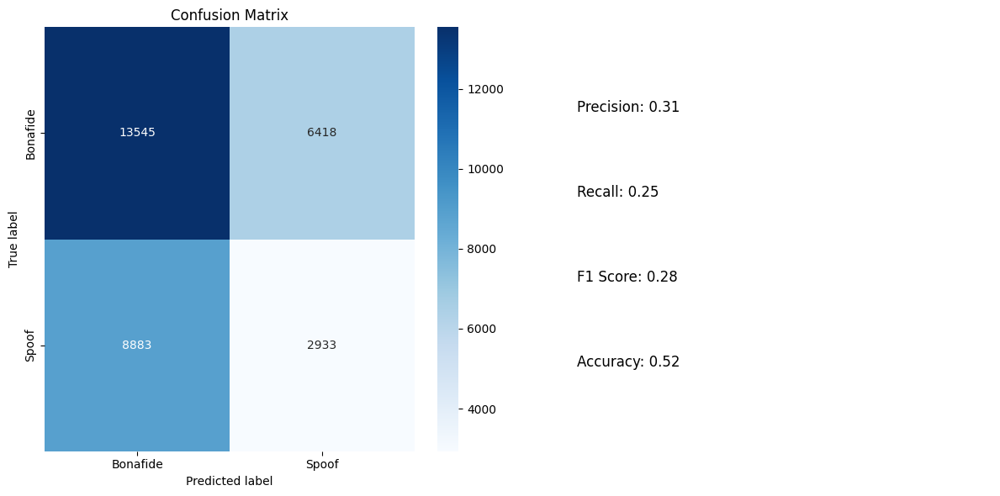

In [6]:
import os
import numpy as np
import pandas as pd
import librosa
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score, accuracy_score
from tensorflow.keras.models import load_model
import shutil

# Load the trained model
model_path = "0.98.keras"  # Replace with the path to your trained model
model = load_model(model_path)

# Function to preprocess a single audio file
def preprocess_single_audio(audio_file, target_size=(128, 128)):
    y, sr = librosa.load(audio_file, sr=None)
    mfcc = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=128)
    resized_mfcc = np.resize(mfcc, target_size)

    max_value = np.max(resized_mfcc)
    normalized_mfcc = resized_mfcc / max_value if max_value > 0 else resized_mfcc

    single_input = np.expand_dims(normalized_mfcc, axis=-1)
    single_input_rgb = np.repeat(single_input, 3, axis=-1)
    single_input_rgb = np.expand_dims(single_input_rgb, axis=0)

    return single_input_rgb

# Function to predict labels for all files in a directory
def predict_from_directory(directory_path, true_label):
    predictions = []
    ground_truth = []

    for file_name in os.listdir(directory_path):
        if file_name.endswith(".wav"):
            file_path = os.path.join(directory_path, file_name)
            processed_audio = preprocess_single_audio(file_path)

            prediction = model.predict(processed_audio)
            predicted_label = 1 if prediction >= 0.5 else 0  # Assuming binary classification (0: Bonafide, 1: Spoof)

            predictions.append(predicted_label)
            ground_truth.append(true_label)

    return predictions, ground_truth

# Step 1: Organize files based on CSV data
def organize_files_from_csv(csv_path, base_audio_path, real_dir, fake_dir):
    # Load the CSV file
    df = pd.read_csv(csv_path)

    # Create directories for bona-fide and spoof files
    os.makedirs(real_dir, exist_ok=True)
    os.makedirs(fake_dir, exist_ok=True)

    # Loop through the DataFrame and move files
    for _, row in df.iterrows():
        file_name = row['file']
        label = row['label']

        source_path = os.path.join(base_audio_path, file_name)
        if label == "bona-fide":
            destination_path = os.path.join(real_dir, file_name)
        elif label == "spoof":
            destination_path = os.path.join(fake_dir, file_name)
        else:
            continue  # Skip if the label is invalid

        # Move the file to the appropriate directory
        if os.path.exists(source_path):
            shutil.copy(source_path, destination_path)

    print("Files have been categorized into 'bona-fide' and 'spoof' directories.")

# Step 2: Integrate organization and prediction
def main():
    # Paths
    csv_path = r'D:\release_in_the_wild\meta.csv'  # Replace with the actual path to the CSV file
    base_audio_path = r'D:\release_in_the_wild'   # Replace with the folder containing audio files
    real_dir = r'D:\real'         # Replace with your desired bona-fide directory path
    fake_dir = r'D:\fake'         # Replace with your desired spoof directory path

    # Step 1: Organize files
    organize_files_from_csv(csv_path, base_audio_path, real_dir, fake_dir)

    # Step 2: Get predictions and ground truths for both directories
    real_predictions, real_ground_truth = predict_from_directory(real_dir, true_label=0)
    fake_predictions, fake_ground_truth = predict_from_directory(fake_dir, true_label=1)

    # Combine predictions and ground truths
    y_pred = real_predictions + fake_predictions
    y_true = real_ground_truth + fake_ground_truth

    # Step 3: Calculate confusion matrix and metrics
    conf_matrix = confusion_matrix(y_true, y_pred, labels=[0, 1])
    precision = precision_score(y_true, y_pred, pos_label=1)
    recall = recall_score(y_true, y_pred, pos_label=1)
    f1 = f1_score(y_true, y_pred, pos_label=1)
    accuracy = accuracy_score(y_true, y_pred)

    # Step 4: Plot the confusion matrix and metrics
    plt.figure(figsize=(12, 6))

    # Subplot 1: Confusion Matrix
    plt.subplot(1, 2, 1)
    sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=["Bonafide", "Spoof"],
                yticklabels=["Bonafide", "Spoof"])
    plt.title("Confusion Matrix")
    plt.xlabel("Predicted label")
    plt.ylabel("True label")

    # Subplot 2: Metrics
    plt.subplot(1, 2, 2)
    plt.text(0.1, 0.8, f"Precision: {precision:.2f}", fontsize=12)
    plt.text(0.1, 0.6, f"Recall: {recall:.2f}", fontsize=12)
    plt.text(0.1, 0.4, f"F1 Score: {f1:.2f}", fontsize=12)
    plt.text(0.1, 0.2, f"Accuracy: {accuracy:.2f}", fontsize=12)
    plt.axis("off")

    plt.tight_layout()
    plt.show()

if __name__ == "__main__":
    main()


In [7]:
import os
import numpy as np
import librosa
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score, accuracy_score
from tensorflow.keras.models import load_model

# Load the trained model
model_path = "0.98.keras"  # Replace with the path to your trained model
model = load_model(model_path)

# Function to preprocess a single audio file
def preprocess_single_audio(audio_file, target_size=(128, 128)):
    y, sr = librosa.load(audio_file, sr=None)
    mfcc = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=128)
    resized_mfcc = np.resize(mfcc, target_size)

    max_value = np.max(resized_mfcc)
    normalized_mfcc = resized_mfcc / max_value if max_value > 0 else resized_mfcc

    single_input = np.expand_dims(normalized_mfcc, axis=-1)
    single_input_rgb = np.repeat(single_input, 3, axis=-1)
    single_input_rgb = np.expand_dims(single_input_rgb, axis=0)

    return single_input_rgb

# Function to predict labels for all files in a directory
def predict_from_directory(directory_path, true_label):
    predictions = []
    ground_truth = []

    for file_name in os.listdir(directory_path):
        if file_name.endswith(".wav"):
            file_path = os.path.join(directory_path, file_name)
            processed_audio = preprocess_single_audio(file_path)

            prediction = model.predict(processed_audio)
            predicted_label = 1 if prediction >= 0.5 else 0  # Assuming binary classification (0: Bonafide, 1: Spoof)

            predictions.append(predicted_label)
            ground_truth.append(true_label)

    return predictions, ground_truth

# Define the directories

real_dir = r'D:\real'         # Replace with your desired bona-fide directory path
fake_dir = r'D:\fake'         # Replace with your desired spoof directory path


# Get predictions and ground truths for both directories
real_predictions, real_ground_truth = predict_from_directory(real_dir, true_label=0)
fake_predictions, fake_ground_truth = predict_from_directory(fake_dir, true_label=1)

# Combine predictions and ground truths
y_pred = real_predictions + fake_predictions
y_true = real_ground_truth + fake_ground_truth

# Calculate confusion matrix and metrics
conf_matrix = confusion_matrix(y_true, y_pred, labels=[0, 1])
precision = precision_score(y_true, y_pred, pos_label=1)
recall = recall_score(y_true, y_pred, pos_label=1)
f1 = f1_score(y_true, y_pred, pos_label=1)
accuracy = accuracy_score(y_true, y_pred)

# Plot the confusion matrix and metrics
plt.figure(figsize=(12, 6))

# Subplot 1: Confusion Matrix
plt.subplot(1, 2, 1)
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=["Bonafide", "Spoof"],
            yticklabels=["Bonafide", "Spoof"])
plt.title("Confusion Matrix")
plt.xlabel("Predicted label")
plt.ylabel("True label")

# Subplot 2: Metrics
plt.subplot(1, 2, 2)
plt.text(0.1, 0.8, f"Precision: {precision:.2f}", fontsize=12)
plt.text(0.1, 0.6, f"Recall: {recall:.2f}", fontsize=12)
plt.text(0.1, 0.4, f"F1 Score: {f1:.2f}", fontsize=12)
plt.text(0.1, 0.2, f"Accuracy: {accuracy:.2f}", fontsize=12)
plt.axis("off")

plt.tight_layout()
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━

KeyboardInterrupt: 

In [4]:
!pip install openpyxl



[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [ ]:
import os
import numpy as np
import pandas as pd
import librosa
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score, accuracy_score
from tensorflow.keras.models import load_model
import shutil

# Load the trained model
model_path = "0.98.keras"  # Replace with the path to your trained model
model = load_model(model_path)

# Function to preprocess a single audio file
def preprocess_single_audio(audio_file, target_size=(128, 128)):
    y, sr = librosa.load(audio_file, sr=None)
    mfcc = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=128)
    resized_mfcc = np.resize(mfcc, target_size)

    max_value = np.max(resized_mfcc)
    normalized_mfcc = resized_mfcc / max_value if max_value > 0 else resized_mfcc

    single_input = np.expand_dims(normalized_mfcc, axis=-1)
    single_input_rgb = np.repeat(single_input, 3, axis=-1)
    single_input_rgb = np.expand_dims(single_input_rgb, axis=0)

    return single_input_rgb

# Function to organize files based on a CSV file and filter by duration
def organize_files_from_csv(csv_path, base_audio_path, real_dir, fake_dir):
    # Load the CSV file
    df = pd.read_csv(csv_path)

    # Create directories for bona-fide and spoof files
    os.makedirs(real_dir, exist_ok=True)
    os.makedirs(fake_dir, exist_ok=True)

    # Loop through the DataFrame and move files
    for _, row in df.iterrows():
        file_name = row['file']  # The name of the audio file
        label = row['label']    # The label: "bona-fide" or "spoof"

        source_path = os.path.join(base_audio_path, file_name)
        if os.path.exists(source_path) and file_name.endswith(".wav"):
            # Calculate the duration of the audio file
            duration = librosa.get_duration(filename=source_path)
            if duration < 5:  # Skip files shorter than 5 seconds
                print(f"Skipped {file_name}: Duration {duration:.2f}s is less than 5 seconds.")
                continue

            # Categorize the file based on the label
            if label == "bona-fide":
                destination_path = os.path.join(real_dir, file_name)
            elif label == "spoof":
                destination_path = os.path.join(fake_dir, file_name)
            else:
                print(f"Invalid label for {file_name}. Skipped.")
                continue

            # Copy the file to the appropriate directory
            shutil.copy(source_path, destination_path)
            print(f"Moved {file_name} to {'real_dir' if label == 'bona-fide' else 'fake_dir'}.")

    print("Files have been organized based on the CSV labels and duration.")

# Function to predict labels for all files in a directory
def predict_from_directory(directory_path, true_label):
    predictions = []
    ground_truth = []

    for file_name in os.listdir(directory_path):
        if file_name.endswith(".wav"):
            file_path = os.path.join(directory_path, file_name)
            
            # Check the duration of the audio file
            duration = librosa.get_duration(filename=file_path)
            if duration < 5:  # Skip files shorter than 5 seconds
                print(f"Skipped {file_name}: Duration {duration:.2f}s is less than 5 seconds.")
                continue

            # Preprocess the audio file and predict
            processed_audio = preprocess_single_audio(file_path)
            prediction = model.predict(processed_audio)
            predicted_label = 1 if prediction >= 0.5 else 0  # Binary classification

            predictions.append(predicted_label)
            ground_truth.append(true_label)

    return predictions, ground_truth

# Main function
def main():
    # Paths
    csv_path = r'D:\release_in_the_wild\meta.csv'  # Replace with the actual path to the CSV file
    base_audio_path = r'D:\release_in_the_wild'   # Replace with the folder containing audio files
    real_dir = r'D:\real'         # Replace with your desired bona-fide directory path
    fake_dir = r'D:\fake'         # Replace with your desired spoof directory path

    # Step 1: Organize files
    organize_files_from_csv(csv_path, base_audio_path, real_dir, fake_dir)

    # Step 2: Get predictions and ground truths for both directories
    real_predictions, real_ground_truth = predict_from_directory(real_dir, true_label=0)
    fake_predictions, fake_ground_truth = predict_from_directory(fake_dir, true_label=1)

    # Combine predictions and ground truths
    y_pred = real_predictions + fake_predictions
    y_true = real_ground_truth + fake_ground_truth

    # Step 3: Calculate confusion matrix and metrics
    conf_matrix = confusion_matrix(y_true, y_pred, labels=[0, 1])
    precision = precision_score(y_true, y_pred, pos_label=1)
    recall = recall_score(y_true, y_pred, pos_label=1)
    f1 = f1_score(y_true, y_pred, pos_label=1)
    accuracy = accuracy_score(y_true, y_pred)

    # Step 4: Plot the confusion matrix and metrics
    plt.figure(figsize=(12, 6))

    # Subplot 1: Confusion Matrix
    plt.subplot(1, 2, 1)
    sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=["Bonafide", "Spoof"],
                yticklabels=["Bonafide", "Spoof"])
    plt.title("Confusion Matrix")
    plt.xlabel("Predicted label")
    plt.ylabel("True label")

    # Subplot 2: Metrics
    plt.subplot(1, 2, 2)
    plt.text(0.1, 0.8, f"Precision: {precision:.2f}", fontsize=12)
    plt.text(0.1, 0.6, f"Recall: {recall:.2f}", fontsize=12)
    plt.text(0.1, 0.4, f"F1 Score: {f1:.2f}", fontsize=12)
    plt.text(0.1, 0.2, f"Accuracy: {accuracy:.2f}", fontsize=12)
    plt.axis("off")

    plt.tight_layout()
    plt.show()

if __name__ == "__main__":
    main()
